# Pseudotime and gene trend analysis of WT posterior midgut

**Input**
* Integrated WT posterior midgut dataset.
* Results of the Lamian TDE test identifying genes differentially expressed along pseudotime.


**Workflow overview**
Trajectory inference was performed by defining one start cell and three terminal cells based on the expression of known marker genes. The resulting pseudotime values, together with normalized gene expression counts and cell metadata, were extracted and used as input for the Lamian workflow.

The set of genes identified by Lamian (2003 genes showing differential expression along pseudotime) was then imported into Palantir to examine their expression dynamics. Genes were clustered based on the similarity of their expression trends along pseudotime using Palantir’s built-in gene trend clustering. Finally, overrepresentation analysis was performed for each gene cluster to identify enriched biological processes and pathways.

**Output**
Clusters of differentially expressed genes along pseudotime.
WT posterior midgut anndata object containing gene trend cluster assignments.

**Saved files**
`DEG_alongPs_cluster.csv` - cluster assignment for differentially expressed genes.
`PMG_deg_ps_clustered.h5ad` - AnnData object with gene trend clustering results.


**Environment**
This notebook was executed using the conda environment defined in `environment_palantir.yml`.

In [ ]:
import os
import random

import numpy as np
import pandas as pd
import scanpy as sc

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import classification_report
from sklearn.metrics.pairwise import cosine_similarity

import warnings
warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2

from scipy.sparse import csr_matrix, issparse

from scipy import io

sc.settings.set_figure_params(dpi=80, frameon=False)
sc.set_figure_params(dpi=80)
sc.set_figure_params(figsize=(4, 4))
plt.rcParams['figure.dpi'] = 80
plt.rcParams['figure.figsize'] = (4, 4)

from scipy.sparse import csr_matrix, issparse

In [ ]:
import gseapy

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
import palantir

In [ ]:
from matplotlib.colors import ListedColormap

#### Pseudotime time analysis using Palantir

In [ ]:
adata_ref = sc.read('../data/processed/mg_wt_tin_lan_refmap.h5ad')

In [ ]:
adata_ref = adata_ref.raw.to_adata()
adata_ref

In [ ]:
adata = sc.read('../data/processed/PMG_6to9_allgenes_cycle.h5ad')
adata

In [ ]:
adata = adata.raw.to_adata()
adata

In [ ]:
adata.raw = adata.copy()

In [ ]:
#subsetting to the same genes were common between WT and mutant datasets
adata = adata[:, adata.var_names.isin(adata_ref.var_names)]
adata

In [ ]:
sc.pl.umap(adata, color='batch')

In [ ]:
adata.X

In [ ]:
adata.layers['raw_counts'] = adata.X.copy()

In [ ]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [ ]:
dm = palantir.utils.run_diffusion_maps(adata, n_components=15, knn=12)

In [ ]:
ms_data = palantir.utils.determine_multiscale_space(adata)

In [ ]:
palantir.plot.plot_diffusion_components(adata)
plt.show()

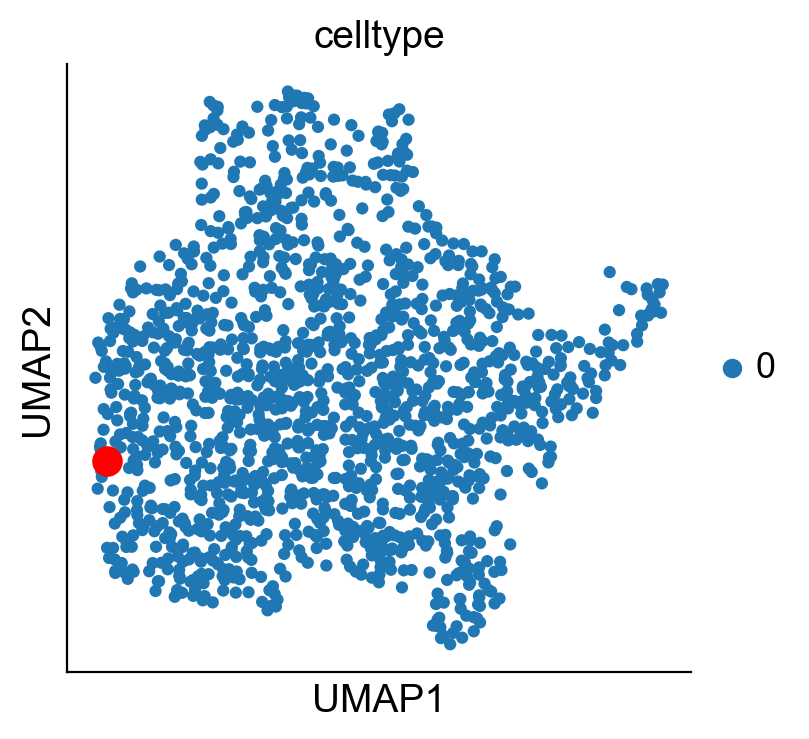

ATACCGCCCATCAAGC-WT_01


In [20]:
# finding the earliest progenitor cell

geneA = 'fkh'
geneB = 'srp'

# Ensure the genes are in the dataset
if geneA in adata.var_names and geneB in adata.var_names:
    # Extract expression values
    geneA_expression = adata[:, geneA].X
    geneB_expression = adata[:, geneB].X
    
    # If data is in sparse format, convert to dense
    if issparse(geneA_expression):
        geneA_expression = geneA_expression.toarray().flatten()
    if issparse(geneB_expression):
        geneB_expression = geneB_expression.toarray().flatten()
    
    # Calculate combined expression
    combined_expression = geneA_expression + geneB_expression
    
    # Find the cell index with the highest combined expression
    cell_index_with_highest_combined_expression = np.argmax(combined_expression)


barcode_of_interest = adata.obs_names[cell_index_with_highest_combined_expression]

# Check if the barcode exists
if barcode_of_interest in adata.obs_names:
    # Find the index of the barcode
    index_of_interest = adata.obs_names.get_loc(barcode_of_interest)
    
    # Generate UMAP plot
    sc.pl.umap(adata, color='celltype', show=False)  # Adjust 'color' as needed for your analysis
    
    # Highlight the barcode of interest
    plt.scatter(adata.obsm['X_umap'][index_of_interest, 0], adata.obsm['X_umap'][index_of_interest, 1], 
                color='red', s=100, label='Barcode of Interest')  # Adjust color and size (s) as needed
    
    # Show the plot
    plt.show()
else:
    print(f"Barcode {barcode_of_interest} not found in the dataset.")

print(barcode_of_interest)

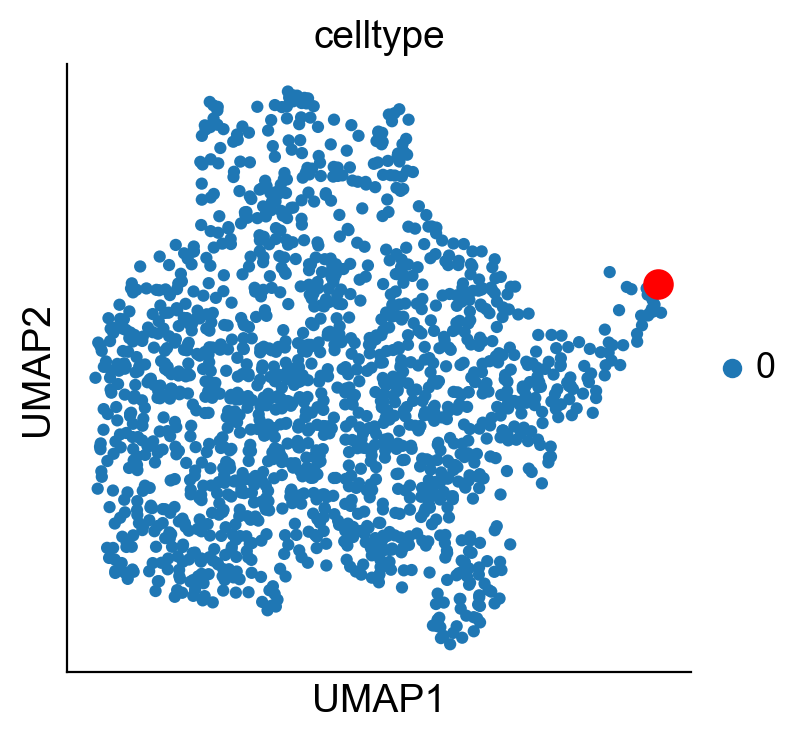

GAAGGCGCTAGATGAC-WT_02


In [21]:
#finding the latest differentiated cell

geneA = 'mesh'
geneB = 'Mal-A3'

# Ensure the genes are in the dataset
if geneA in adata.var_names and geneB in adata.var_names:
    # Extract expression values
    geneA_expression = adata[:, geneA].X
    geneB_expression = adata[:, geneB].X
    
    # If data is in sparse format, convert to dense
    if issparse(geneA_expression):
        geneA_expression = geneA_expression.toarray().flatten()
    if issparse(geneB_expression):
        geneB_expression = geneB_expression.toarray().flatten()
    
    # Calculate combined expression
    combined_expression = geneA_expression + geneB_expression
    
    # Find the cell index with the highest combined expression
    cell_index_with_highest_combined_expression = np.argmax(combined_expression)


barcode_of_interest = adata.obs_names[cell_index_with_highest_combined_expression]

# Check if the barcode exists
if barcode_of_interest in adata.obs_names:
    # Find the index of the barcode
    index_of_interest = adata.obs_names.get_loc(barcode_of_interest)
    
    # Generate UMAP plot
    sc.pl.umap(adata, color='celltype', show=False)  # Adjust 'color' as needed for your analysis
    
    # Highlight the barcode of interest
    plt.scatter(adata.obsm['X_umap'][index_of_interest, 0], adata.obsm['X_umap'][index_of_interest, 1], 
                color='red', s=100, label='Barcode of Interest')  # Adjust color and size (s) as needed
    
    # Show the plot
    plt.show()
else:
    print(f"Barcode {barcode_of_interest} not found in the dataset.")

print(barcode_of_interest)

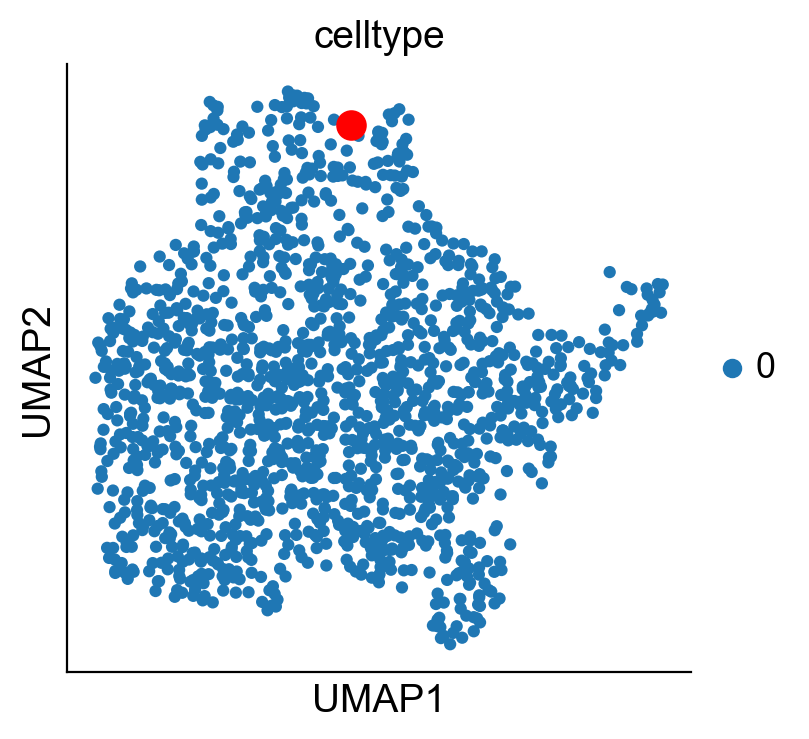

GCCTATTCAGTCTCCG-WT_04


In [22]:
#finding the latest differentiated cell in the most posterior part

geneA = 'drm'
geneB = 'mesh'

# Ensure the genes are in the dataset
if geneA in adata.var_names and geneB in adata.var_names:
    # Extract expression values
    geneA_expression = adata[:, geneA].X
    geneB_expression = adata[:, geneB].X
    
    # If data is in sparse format, convert to dense
    if issparse(geneA_expression):
        geneA_expression = geneA_expression.toarray().flatten()
    if issparse(geneB_expression):
        geneB_expression = geneB_expression.toarray().flatten()
    
    # Calculate combined expression
    combined_expression = geneA_expression + geneB_expression
    
    # Find the cell index with the highest combined expression
    cell_index_with_highest_combined_expression = np.argmax(combined_expression)


barcode_of_interest = adata.obs_names[cell_index_with_highest_combined_expression]

# Check if the barcode exists
if barcode_of_interest in adata.obs_names:
    # Find the index of the barcode
    index_of_interest = adata.obs_names.get_loc(barcode_of_interest)
    
    # Generate UMAP plot
    sc.pl.umap(adata, color='celltype', show=False)  # Adjust 'color' as needed for your analysis
    
    # Highlight the barcode of interest
    plt.scatter(adata.obsm['X_umap'][index_of_interest, 0], adata.obsm['X_umap'][index_of_interest, 1], 
                color='red', s=100, label='Barcode of Interest')  # Adjust color and size (s) as needed
    
    # Show the plot
    plt.show()
else:
    print(f"Barcode {barcode_of_interest} not found in the dataset.")

print(barcode_of_interest)

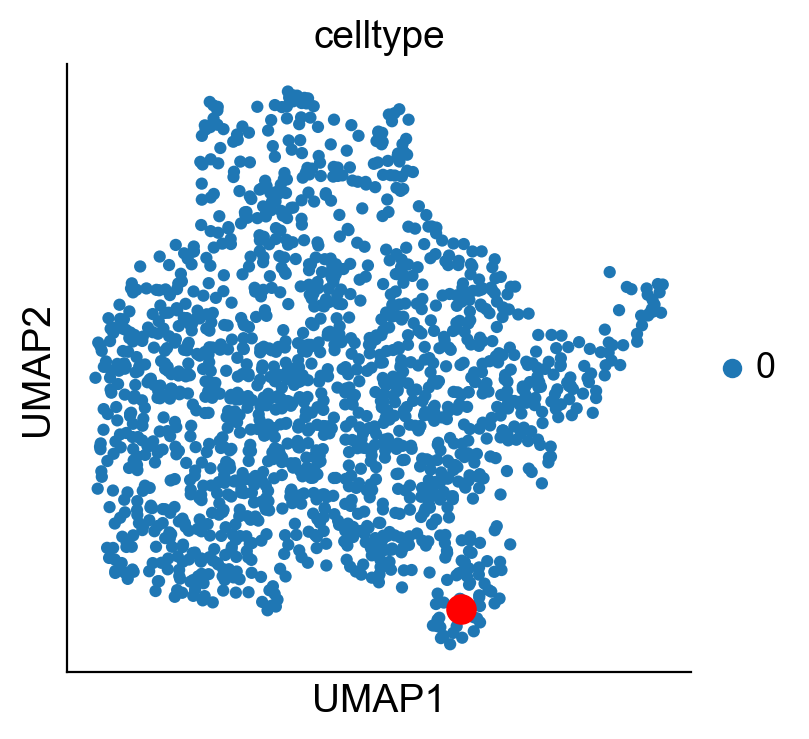

GACGATAATTGACTAT-WT_02


In [23]:
#finding the latest differentiated cell in the middle midgut (close to it)

geneA = 'mesh'
geneB = 'Ptx1'

# Ensure the genes are in the dataset
if geneA in adata.var_names and geneB in adata.var_names:
    # Extract expression values
    geneA_expression = adata[:, geneA].X
    geneB_expression = adata[:, geneB].X
    
    # If data is in sparse format, convert to dense
    if issparse(geneA_expression):
        geneA_expression = geneA_expression.toarray().flatten()
    if issparse(geneB_expression):
        geneB_expression = geneB_expression.toarray().flatten()
    
    # Calculate combined expression
    combined_expression = geneA_expression + geneB_expression
    
    # Find the cell index with the highest combined expression
    cell_index_with_highest_combined_expression = np.argmax(combined_expression)


barcode_of_interest = adata.obs_names[cell_index_with_highest_combined_expression]

# Check if the barcode exists
if barcode_of_interest in adata.obs_names:
    # Find the index of the barcode
    index_of_interest = adata.obs_names.get_loc(barcode_of_interest)
    
    # Generate UMAP plot
    sc.pl.umap(adata, color='celltype', show=False)  # Adjust 'color' as needed for your analysis
    
    # Highlight the barcode of interest
    plt.scatter(adata.obsm['X_umap'][index_of_interest, 0], adata.obsm['X_umap'][index_of_interest, 1], 
                color='red', s=100, label='Barcode of Interest')  # Adjust color and size (s) as needed
    
    # Show the plot
    plt.show()
else:
    print(f"Barcode {barcode_of_interest} not found in the dataset.")

print(barcode_of_interest)

In [ ]:
start_cell_wt = 'ATACCGCCCATCAAGC-WT_01'
terminal_cell_wt = pd.Series(['central_PMG','PMG–hindgut', 'PMG–MMG'],
                             index=['GAAGGCGCTAGATGAC-WT_02', 'GCCTATTCAGTCTCCG-WT_04', 'GACGATAATTGACTAT-WT_02'])

In [ ]:
adata = adata.copy()

In [ ]:
#running palantir
pr_res = palantir.core.run_palantir(
    adata, early_cell=start_cell_wt, terminal_states=terminal_cell_wt 
)

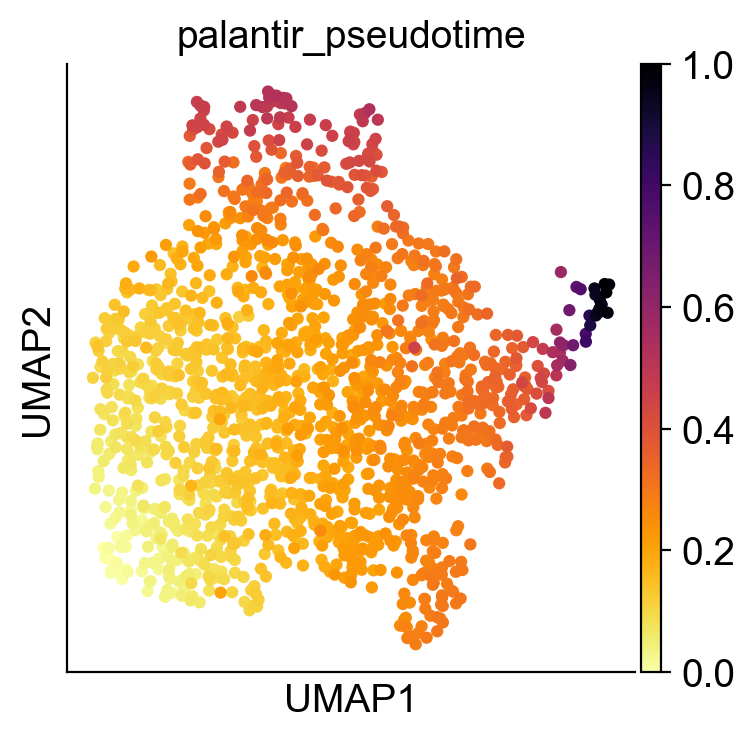

In [27]:
sc.pl.umap(adata, color='palantir_pseudotime', legend_loc='lower right', legend_fontsize=8, cmap='inferno_r')

In [ ]:
sc.pl.umap(adata, color=['drm', 'Ptx1', 'dve', 'fkh', 'srp', 'mesh'], vmax='p99', cmap='Reds')

In [ ]:
sc.pl.scatter(adata, x='drm', y='mesh')

In [ ]:
adata.X

#### Preparing input for Lamina workflow in R

In [ ]:
pseudotime = pd.Series(data=adata.obs['palantir_pseudotime'], index=adata.obs_names)
pseudotime

In [ ]:
pseudotime.to_csv('../data/processed/pseudotime_vector_pmg.csv', header=False, index=True)

In [ ]:
adata.X

In [ ]:
expr_norm = adata.to_df()

In [ ]:
expr_norm

In [ ]:
expr_norm.to_csv('../data/processed/PMG_Norm_allgenes_expr.csv', header=True, index=True)

In [ ]:
adata.X

In [ ]:
metadata = adata.obs['batch']
metadata.to_csv('../data/processed/PMG_allgenes_metadata.csv', header=True, index=True,)

#### Genes differentially expressed (DEG) along pseudotime  - the result of Lamian TDE test

checking if any of the DEG along pseudotime have zero counts across cells 

In [ ]:
import scipy.sparse as sp

In [ ]:
if sp.issparse(expr_norm):
    zero_genes = np.array(expr_norm.sum(axis=0)).ravel() == 0
else:
    zero_genes = expr_norm.sum(axis=0) == 0

n_zero_genes = zero_genes.sum()
print(n_zero_genes)

zero_gene_names = adata.var_names[zero_genes]


In [ ]:
diff_genes = pd.read_csv('../data/processed/TDE_wt_pmg.csv')
diff_genes

In [ ]:
# this is just to check if genes with zero expression values are among the TDE genes -> which are not
diff_genes[diff_genes['gene'].isin(zero_gene_names)]

#### Grouping genes based on the similarities in their expression trend along pseudotime

In [ ]:
#subsetting variables to only DEGs
adata_sub = adata[:,adata.var_names.isin(diff_genes['gene'])]
adata_sub

In [ ]:
masks = palantir.presults.select_branch_cells(adata_sub)

In [ ]:
#three possible trajectories - one towards the most posterior, one towards the middle and one towards the main posterior
palantir.plot.plot_branch_selection(adata_sub)
plt.show()

In [ ]:
adata_sub

(<Figure size 600x600 with 1 Axes>, <Axes: >)

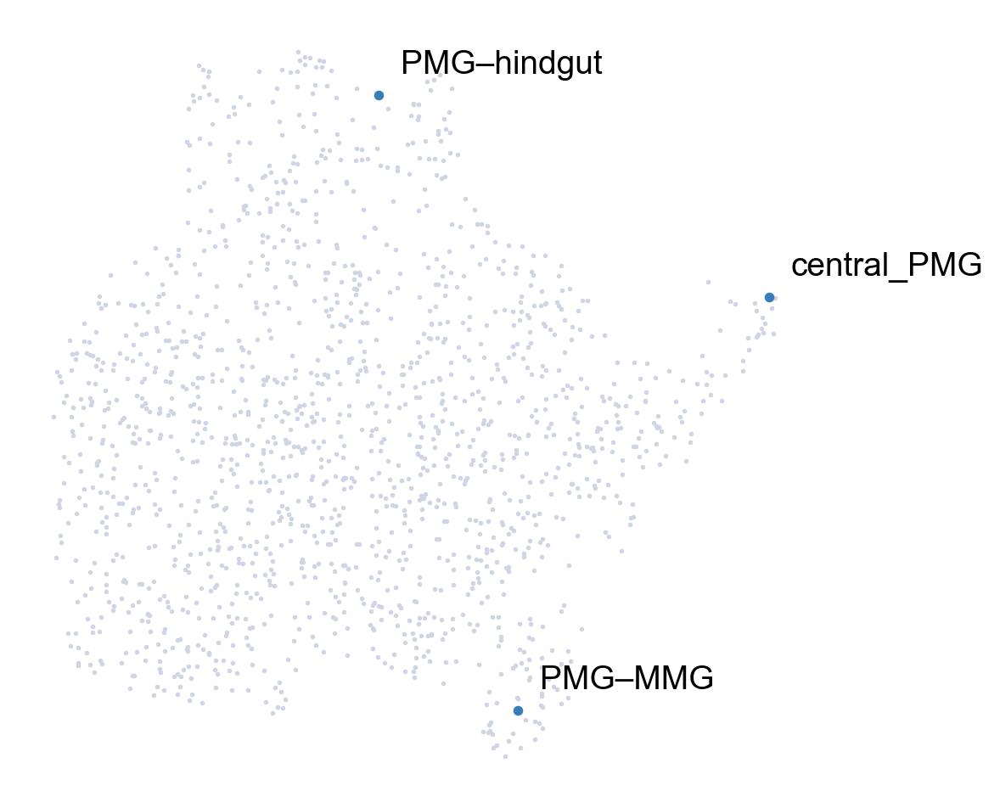

In [47]:
palantir.plot.highlight_cells_on_umap(adata_sub, cells=terminal_cell_wt)

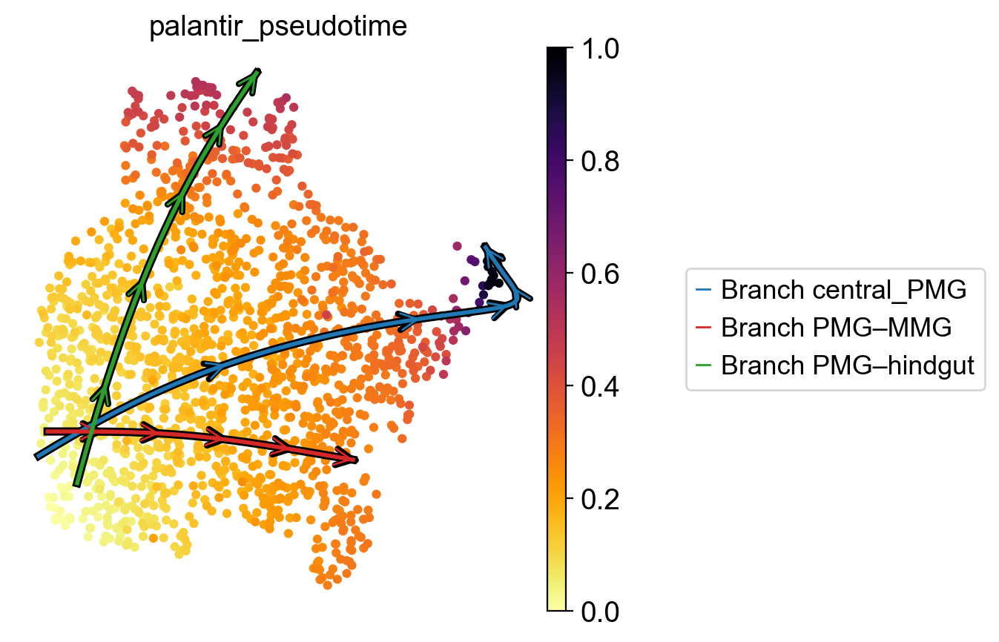

In [48]:
palantir.plot.plot_trajectories(adata_sub, palantir_fates_colors=["#1f77b4", "#d62728", "#2ca02c"], 
                                legend_kwargs={"loc": "center left", "bbox_to_anchor": (1.25, 0.5)}, scanpy_kwargs={'cmap':'inferno_r'})
plt.savefig('../figures/palantir_trajectories.pdf', dpi=300, bbox_inches='tight')

In [ ]:
adata_sub.obs['term_states_fwd_probs']

In [ ]:
adata_sub.layers['logcounts']=adata_sub.X.copy()

In [ ]:
imputed_X = palantir.utils.run_magic_imputation(adata_sub, expression_key='logcounts')

In [ ]:
adata_sub

In [ ]:
adata_sub.X=adata_sub.layers['MAGIC_imputed_data'].copy()

In [ ]:
gene_trends = palantir.presults.compute_gene_trends(
    adata_sub,
    expression_key="MAGIC_imputed_data",
)

In [ ]:
palantir.plot.plot_gene_trends(adata_sub, ['fkh', 'mesh'])

In [ ]:
#clustering genes based on the similarities in their expression trend
communities = palantir.presults.cluster_gene_trends(adata_sub, branch_name='central_PMG', genes=adata_sub.var_names, random_state=42, n_neighbors=80)

In [ ]:
palantir.plot.plot_gene_trend_clusters(adata_sub, "central_PMG")

In [ ]:
#make the clustering number tidy just for better visualization
desired_genes = adata_sub.var.copy()
desired_genes['Gene'] = desired_genes.index
desired_genes

In [ ]:
desired_genes[desired_genes['gene_trends_clusters']=='4'].iloc[0:50]

In [ ]:
desired_genes['gene_trends_clusters'].unique()

In [ ]:
desired_order=['5', '1', '3', '2', '4', '0', '7', '8', '6']
# use the desired order instead of numeric or alphabetical order
desired_genes['gene_trends_clusters'] = pd.Categorical(desired_genes['gene_trends_clusters'], categories=desired_order, ordered=True)

In [ ]:
desired_genes

In [ ]:
desired_genes = desired_genes.sort_values("gene_trends_clusters")

In [ ]:
cluster_map = {old: new for new, old in enumerate(desired_order, start=1)}

desired_genes['gene_trends_clusters_new'] = (
    desired_genes['gene_trends_clusters']
    .astype(str)
    .map(cluster_map)
)

In [ ]:
desired_genes

In [ ]:
#the expression values are MAGIC imputed data
adata_sub.X

In [ ]:
expression= adata_sub.to_df()  # Assuming your gene expression data is in .X and genes are in .var

In [ ]:
# Sort the DataFrame based on pseudotime
expression_sorted = expression.loc[adata_sub.obs.sort_values('palantir_pseudotime').index]

In [ ]:
expression_sorted=expression_sorted[desired_genes['Gene']]

In [ ]:
expression_sorted

In [ ]:
# Initialize the MinMaxScaler to scale between 0 and 1
scaler = MinMaxScaler()

# Assuming df_sorted is your DataFrame from the previous steps
# Apply the scaler to the DataFrame
expression_scaled = pd.DataFrame(scaler.fit_transform(expression_sorted), index=expression_sorted.index, columns=expression_sorted.columns)

In [ ]:
expression_scaled=expression_scaled.T

In [ ]:
clusters_new = desired_genes['gene_trends_clusters_new'].astype(int).values
clusters_new

In [ ]:
n_clusters = clusters_new.max()
palette = sns.color_palette("tab10", n_clusters)
cluster_cmap = ListedColormap(palette)

Text(0.5, 144.44444444444449, 'Palantir pseudotime')

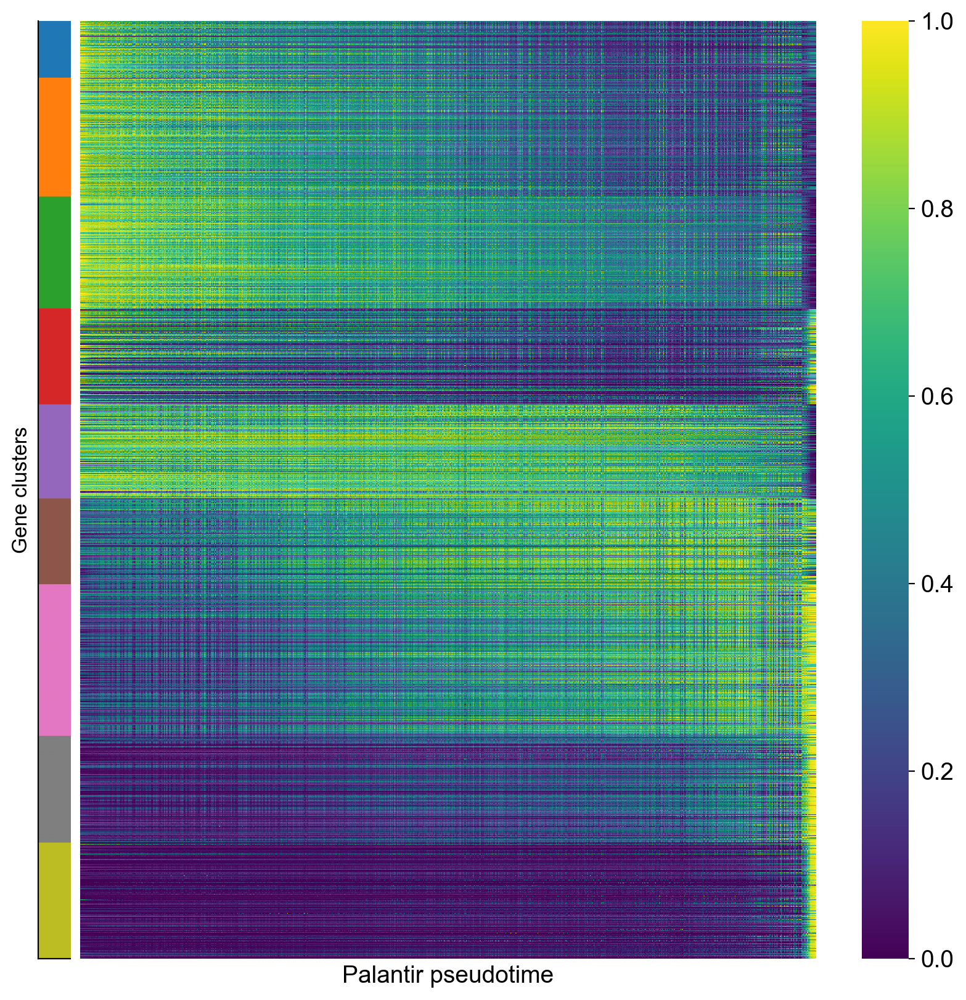

In [76]:
fig = plt.figure(figsize=(10, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[0.35, 10], wspace=0.02)

# ---- Left: cluster annotation bar ----
ax_bar = fig.add_subplot(gs[0])
ax_bar.imshow(
    clusters_new.reshape(-1, 1),
    aspect="auto",
    cmap=cluster_cmap
)
ax_bar.set_xticks([])
ax_bar.set_yticks([])
ax_bar.set_ylabel("Gene clusters", fontsize=12)

# ---- Right: heatmap ----
ax_hm = fig.add_subplot(gs[1])
sns.heatmap(
    expression_scaled,
    cmap="viridis",
    yticklabels=False,
    xticklabels=False,
    ax=ax_hm
)
ax_hm.set_xlabel("Palantir pseudotime")

fig.savefig("../figures/wt_gene_trend_heatmap.png", dpi=300, bbox_inches='tight')

In [ ]:
adata_sub.var['module_reindexed'] = desired_genes['gene_trends_clusters_new']
adata_sub.var

In [ ]:
del adata_sub.var['gene_trends_clusters']

In [ ]:
adata_sub.var = adata_sub.var.rename(columns= {'module_reindexed':'gene_trends_clusters'})
adata_sub.var

In [ ]:
adata_sub.var['gene_trends_clusters'].to_csv('DE_alongPseudotime_cluster.csv')

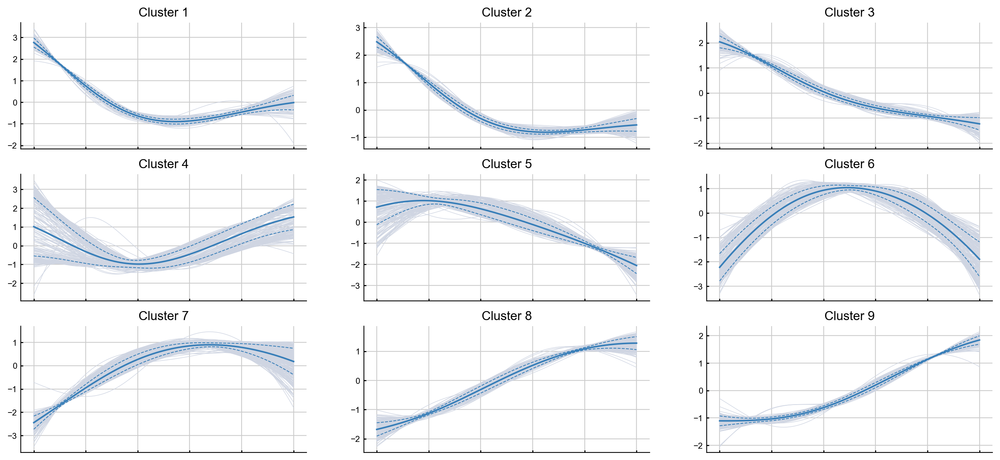

In [81]:
palantir.plot.plot_gene_trend_clusters(adata_sub, "central_PMG")
plt.savefig("../figures/gene_trend_cluster.pdf", dpi=300, bbox_inches='tight')

In [ ]:
palantir.plot.plot_gene_trend_clusters(adata_sub, "central_PMG")

fig = plt.gcf()
axes = fig.axes

height = 0.075
spacing = 0.09   # slightly larger than height

for i, ax in enumerate(axes):
    ax.set_position([0.12, 0.95 - (i + 1) * spacing, 0.75, height])

fig.set_size_inches(4, len(axes) * 2.3)
#plt.savefig("../figures/gene_trend_cluster.pdf", dpi=300, bbox_inches='tight')

#### Overrepresentation analysis to know more about the function of the genes in each module

In [ ]:
gene_modules = {}

for cl in sorted(adata_sub.var['gene_trends_clusters'].unique()):
    genes = adata_sub.var_names[
        adata_sub.var['gene_trends_clusters'] == cl
    ].tolist()
    gene_modules[str(cl)] = genes

In [ ]:
enr = {}
for cl in sorted(adata_sub.var["gene_trends_clusters"].unique()):
    module = str(cl)
    genes = gene_modules[module]
    if not genes:
        continue

    enr[module] = {
        "GO_Biological_Process_2018": gseapy.enrichr(
            gene_list=genes, organism="Fly",
            gene_sets="GO_Biological_Process_2018", cutoff=0.05
        ).results,
        "GO_Molecular_Function_2018": gseapy.enrichr(
            gene_list=genes, organism="Fly",
            gene_sets="GO_Molecular_Function_2018", cutoff=0.05
        ).results,
        "KEGG_2019": gseapy.enrichr(
            gene_list=genes, organism="Fly",
            gene_sets="KEGG_2019", cutoff=0.05
        ).results,
    }

In [ ]:
top = {}
genesets = ["GO_Biological_Process_2018", "GO_Molecular_Function_2018", "KEGG_2019"]

for module, res_dict in enr.items():
    top[module] = {
        gs: res_dict[gs].sort_values("Adjusted P-value").head(3)
        for gs in genesets
        if res_dict[gs] is not None and len(res_dict[gs]) > 0
    }

In [ ]:
df_list = []
for module, dic in top.items():
    for gs, df in dic.items():
        tmp = df.copy()
        tmp["Gene_set"] = gs
        tmp["Module"] = int(module)
        df_list.append(tmp)

combined_df = pd.concat(df_list, ignore_index=True)

In [ ]:
combined_df['Module'] = combined_df['Module'].astype(int)

In [ ]:
BP_combined = combined_df[combined_df['Gene_set']=='GO_Biological_Process_2018']

In [ ]:
module_order = sorted(BP_combined['Module'].unique())

In [ ]:
MF_combined = combined_df[combined_df['Gene_set']=='GO_Molecular_Function_2018']

In [ ]:
KEGG = combined_df[combined_df['Gene_set']=='KEGG_2019']

In [ ]:
len(BP_combined)

In [ ]:
BP_combined

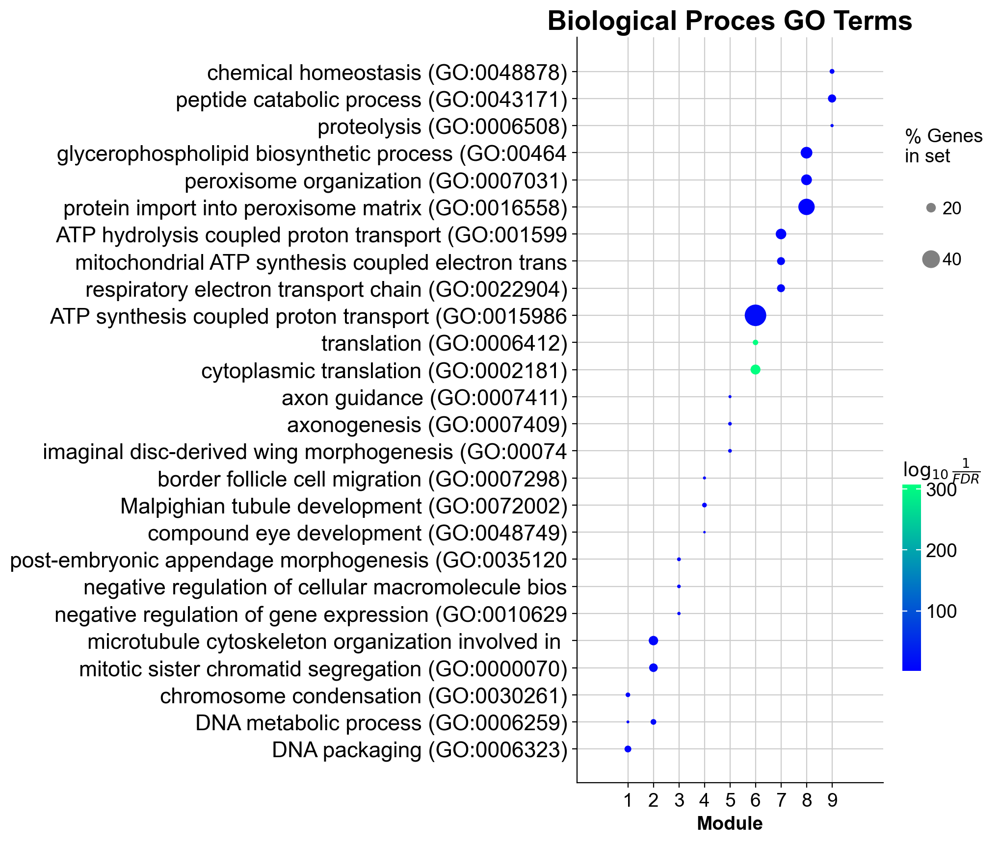

In [96]:
#I would rather not to use colormaps with white in the spectrum cause some dots would not be visible on the plot
BP_combined['Term'] = BP_combined['Term'].str.slice(0, 50)
ax = gseapy.dotplot(BP_combined, x= 'Module', figsize=(5,10), title="Biological Proces GO Terms", cmap = plt.cm.winter, cutoff=0.05, y_order=BP_combined['Term'].tolist(), 
              top_term=30)

ax.set_xticks(module_order)
ax.set_xticklabels(module_order)

plt.tight_layout()
ax.figure.savefig(
    "../figures/GO_BP_dotplot_genetrend.pdf",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

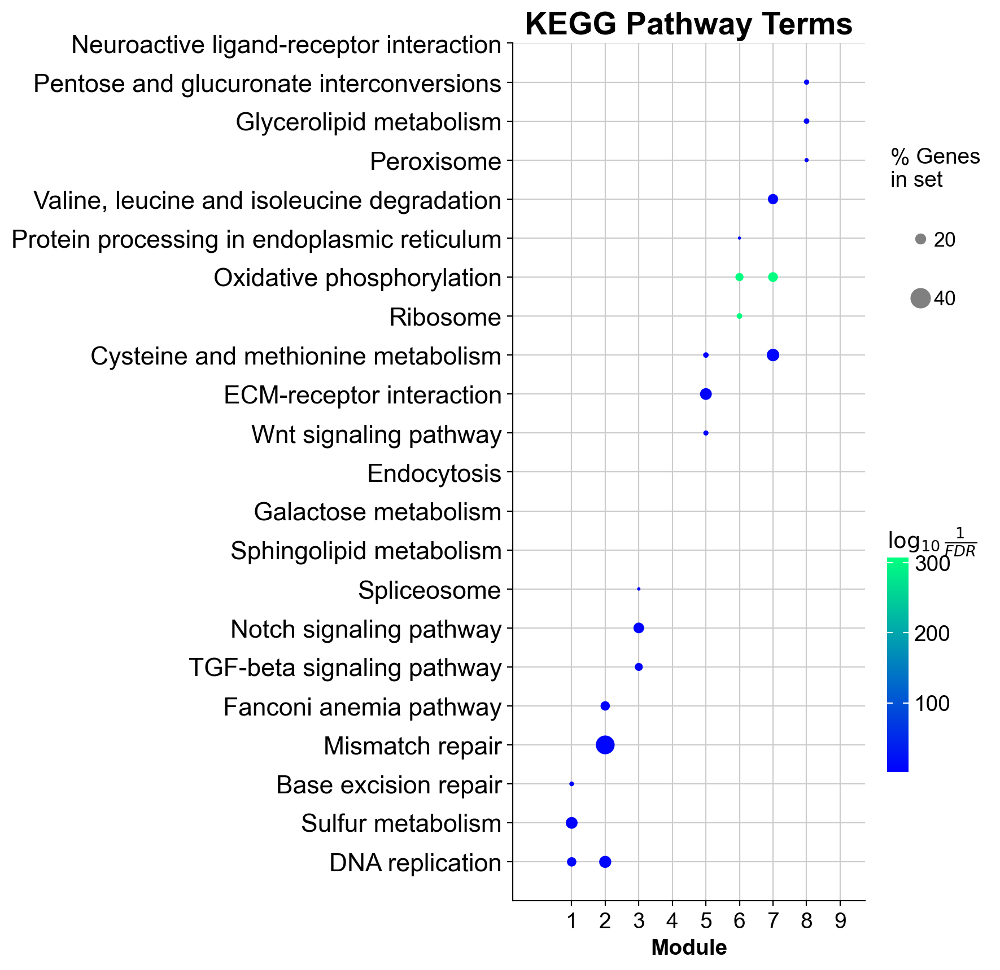

In [98]:
KEGG['Term'] = KEGG['Term'].str.slice(0,50)
ax = gseapy.dotplot(KEGG, x = 'Module', figsize=(5,10), title="KEGG Pathway Terms", cmap = plt.cm.winter, cutoff=0.05, y_order=KEGG['Term'].tolist(), 
              top_term=30)

ax.set_xticks(module_order)
ax.set_xticklabels(module_order)

plt.tight_layout()
ax.figure.savefig(
    "../figures/KEGG_dotplot_genetrend.pdf",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

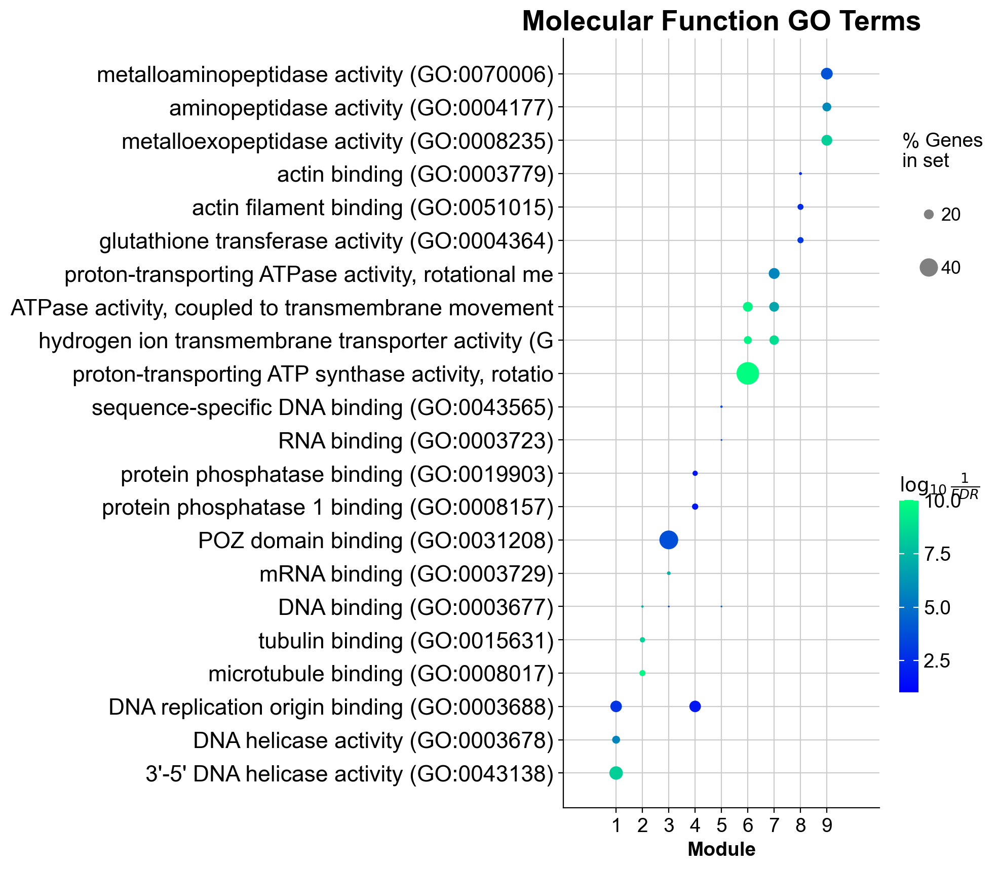

In [99]:
MF_combined['Term'] = MF_combined['Term'].str.slice(0,50)
ax = gseapy.dotplot(MF_combined, x= 'Module', figsize=(5,10), title="Molecular Function GO Terms", cmap = plt.cm.winter, cutoff=0.05, y_order=MF_combined['Term'].tolist(), 
              top_term=30)

ax.set_xticks(module_order)
ax.set_xticklabels(module_order)

plt.tight_layout()
ax.figure.savefig(
    "../figures/GO_MF_dotplot_genetrend.pdf",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

In [ ]:
desired_genes[['Gene', 'gene_trends_clusters_new']].to_csv('../data/processed/DEG_alongPs_cluster.csv')

In [ ]:
adata_sub.write('../data/processed/PMG_deg_ps_clustered.h5ad')